In [151]:
import pandas as pd
import networkx as nx
from datetime import datetime
import matplotlib as mpl
import numpy as np
from pylab import rcParams
import community
import matplotlib.colors as mcolors


In [ ]:
!pip install networkx python-louvain

In [3]:
df1 = pd.read_csv(r'')

In [4]:
df2 = pd.read_csv(r'')

In [9]:
frames = [df1,df2]
full_df = pd.concat(frames)

In [10]:
full_df.head()

,Unnamed: 0,ts,from,to,body,body_en,body_language
0,0,2020-08-23T14:06:00.707309,bentley@q3mcco35auwcstmt.onion,deploy@q3mcco35auwcstmt.onion,Привет )),Hey )),ru
1,1,2020-08-23T14:06:08.229765,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Привет,Hey,NaN
2,2,2020-08-23T14:06:08.231672,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,ygybvyvuvhhvuvyvugzzzzzmmm,ygybvyvuvhhvuvyvugzzzzzmmm,ru
3,3,2020-08-23T14:06:08.234397,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Chil102.exe chil103.dll,Chil102.exe chil103.dll,en
4,4,2020-08-23T14:06:08.236029,bentley@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Свежие Чилы у Марселя,Fresh chillies near Marseille,ru


In [13]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 168740 entries, 0 to 60772
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Unnamed: 0     168740 non-null  int64 
 1   ts             168740 non-null  object
 2   from           168740 non-null  object
 3   to             168740 non-null  object
 4   body           168740 non-null  object
 5   body_en        168740 non-null  object
 6   body_language  140287 non-null  object
dtypes: int64(1), object(6)
memory usage: 10.3+ MB


In [73]:
name_df = full_df

name_df["to_short"] = name_df["to"].str.split('@').str[0]
name_df["to_short"] = name_df["to_short"].str.lower()
name_df["from_short"] = name_df["from"].str.split('@').str[0]
name_df["from_short"] = name_df["from_short"].str.lower()
name_df["ts"] = pd.to_datetime(name_df["ts"])

name_df.head()

,Unnamed: 0,ts,from,to,body,body_en,body_language,to_short,from_short
0,0,2020-08-23 14:06:00.707309,bentley@q3mcco35auwcstmt.onion,deploy@q3mcco35auwcstmt.onion,Привет )),Hey )),ru,deploy,bentley
1,1,2020-08-23 14:06:08.229765,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Привет,Hey,NaN,hof,marsel
2,2,2020-08-23 14:06:08.231672,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,ygybvyvuvhhvuvyvugzzzzzmmm,ygybvyvuvhhvuvyvugzzzzzmmm,ru,hof,marsel
3,3,2020-08-23 14:06:08.234397,marsel@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Chil102.exe chil103.dll,Chil102.exe chil103.dll,en,hof,marsel
4,4,2020-08-23 14:06:08.236029,bentley@q3mcco35auwcstmt.onion,hof@q3mcco35auwcstmt.onion,Свежие Чилы у Марселя,Fresh chillies near Marseille,ru,hof,bentley


In [11]:
node_series = name_df['to_short']
node_series = node_series.append(name_df['from_short'])
node_series = node_series.drop_duplicates()


337480
465


C:\Users\1T00127\AppData\Local\Temp\ipykernel_31848\2831494131.py:2: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  node_series = node_series.append(full_df['from'])


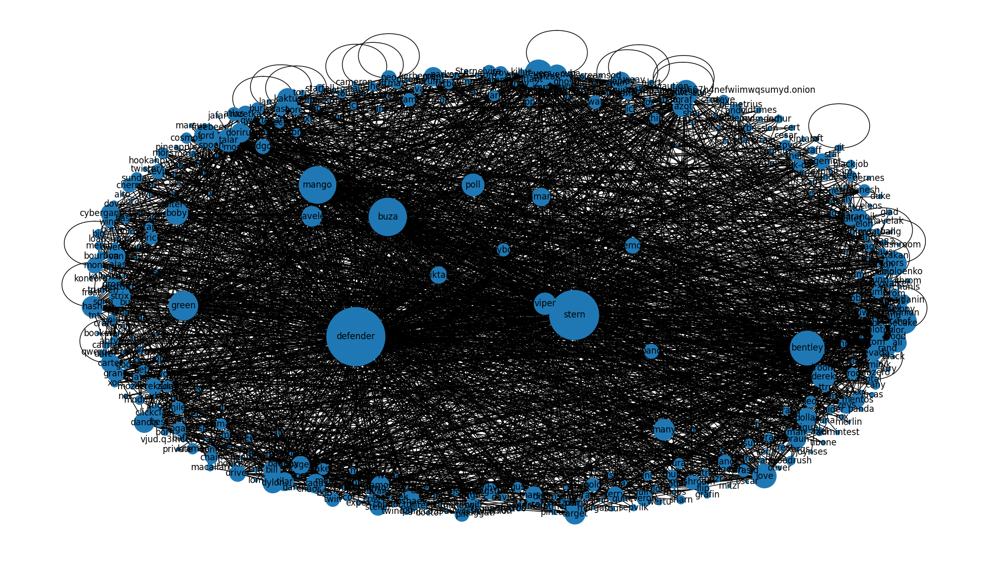

In [26]:
mpl.rcParams['figure.figsize'] = 19.2,10.8

G = nx.Graph()
G.add_nodes_from(node_series)
G = nx.from_pandas_edgelist(name_df, source='to_short',target='from_short')
pos = nx.spring_layout(G,scale=500,k=50/np.sqrt(G.order()))
d = dict(G.degree)

nx.draw(G, pos, node_size=[d[k]*20 for k in d], with_labels=True)

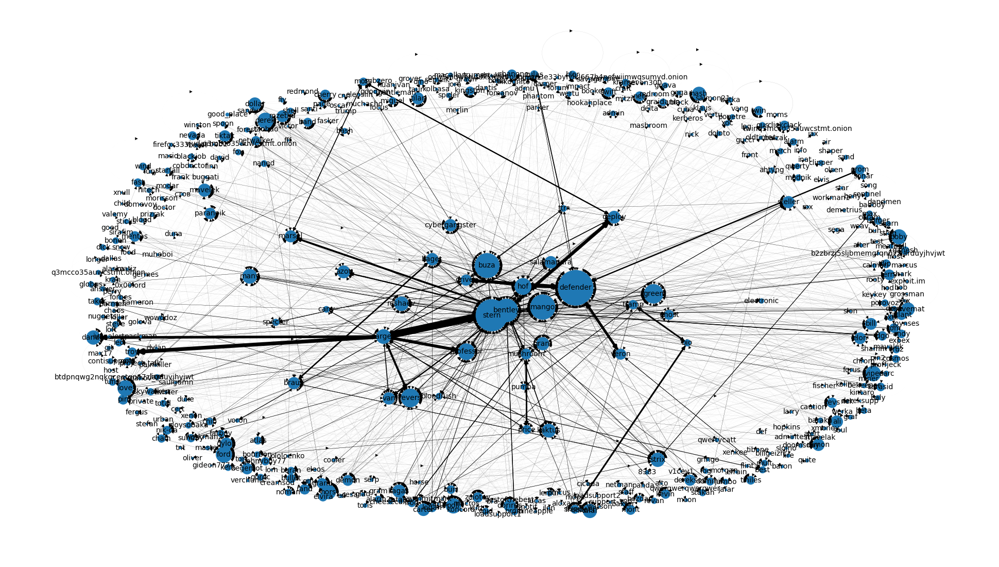

In [75]:
from matplotlib import colors

# Create a directed graph
G = nx.DiGraph()

# Count the conversations between users and add weighted edges
conversations = name_df.groupby(['from_short', 'to_short']).size().reset_index(name='weight')
for _, row in conversations.iterrows():
    G.add_edge(row['from_short'], row['to_short'], weight=row['weight'])

# Find the maximum conversation weight
max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])

# Set a fixed maximum edge thickness (e.g., 10pt)
max_thickness = 10.0

# Calculate edge thicknesses based on normalized weights
edge_thicknesses = [max_thickness * (d['weight'] / max_weight) for u, v, d in G.edges(data=True)]

# Remove the bottom 50% of nodes
#nodes_to_remove = sorted(G.nodes(), key=lambda node: G.degree(node))[:len(G) // 2]
#G.remove_nodes_from(nodes_to_remove)

# Spread out the graph using a different layout algorithm (e.g., Kamada-Kaway)
pos = nx.spring_layout(G, k=5)

# Scale down node sizes relative to degree
node_sizes = [5 * G.degree(node) for node in G.nodes()]

# Draw the graph with scaled edge thicknesses
nx.draw(G, pos, with_labels=True, node_size=node_sizes, font_size=10, width=edge_thicknesses)

# Show the graph
plt.show()

C:\Users\1T00127\AppData\Local\Temp\ipykernel_31848\3457723307.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  nx.draw(G, pos, with_labels=True, node_size=node_sizes, font_size=10, width=edge_thicknesses, node_color=node_colors, cmap=plt.cm.get_cmap('viridis', max(partition.values()) + 1))


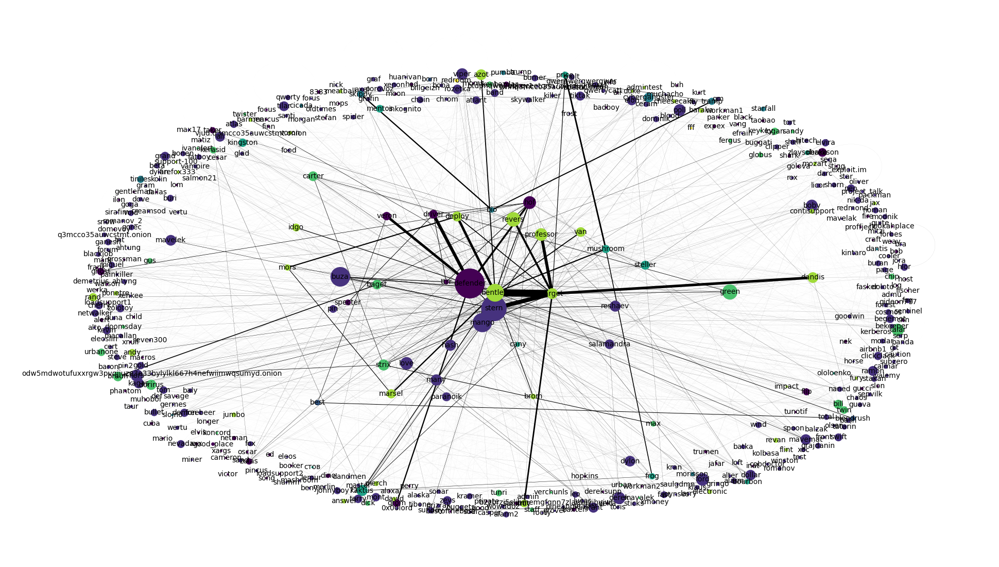

In [123]:
# Create a directed graph
G = nx.Graph()

# Count the conversations between users and add weighted edges
conversations = name_df.groupby(['from_short', 'to_short']).size().reset_index(name='weight')
for _, row in conversations.iterrows():
    G.add_edge(row['from_short'], row['to_short'], weight=row['weight'])

# Perform community detection using the Louvain algorithm
partition = community.best_partition(G)

# Add the community partition as a node attribute
nx.set_node_attributes(G, partition, name='community')

# Find the maximum conversation weight
max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])

# Set a fixed maximum edge thickness (e.g., 10pt)
max_thickness = 10.0

# Calculate edge thicknesses based on normalized weights
edge_thicknesses = [max_thickness * (d['weight'] / max_weight) for u, v, d in G.edges(data=True)]

# Spread out the graph using a different layout algorithm (e.g., Kamada-Kaway)
pos = nx.spring_layout(G, k=5)

# Scale down node sizes relative to degree
node_sizes = [5 * G.degree(node) for node in G.nodes()]

# Draw the graph with community coloring and scaled edge thicknesses
node_colors = [partition[node] for node in G.nodes()]
nx.draw(G, pos, with_labels=True, node_size=node_sizes, font_size=10, width=edge_thicknesses, node_color=node_colors, cmap=plt.cm.get_cmap('viridis', max(partition.values()) + 1))

# Show the graph
plt.show()

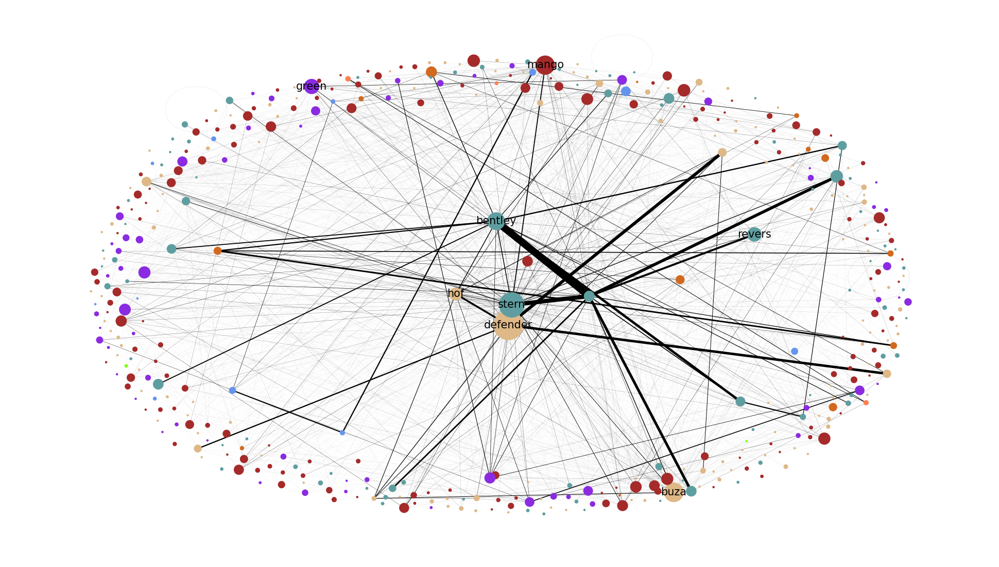

In [156]:
# Create a directed graph
G = nx.Graph()

# Count the conversations between users and add weighted edges
conversations = name_df.groupby(['from_short', 'to_short']).size().reset_index(name='weight')
for _, row in conversations.iterrows():
    G.add_edge(row['from_short'], row['to_short'], weight=row['weight'])

# Perform community detection using the Louvain algorithm
partition = community.best_partition(G)

# Add the community partition as a node attribute
nx.set_node_attributes(G, partition, name='community')

# Find the maximum conversation weight
max_weight = max([d['weight'] for u, v, d in G.edges(data=True)])

# Set a fixed maximum edge thickness (e.g., 10pt)
max_thickness = 10.0

# Calculate edge thicknesses based on normalized weights
edge_thicknesses = [max_thickness * (d['weight'] / max_weight) for u, v, d in G.edges(data=True)]

# Spread out the graph using a different layout algorithm (e.g., Kamada-Kaway)
pos = nx.spring_layout(G, k=8)

# Calculate Degree Centrality for each node
degree_centrality = nx.degree_centrality(G)

# Sort nodes by Degree Centrality and extract the bottom 50 nodes
bottom_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:8]

# Dictionary to specify labels for nodes
labels = {node: node if node in bottom_nodes else '' for node in G.nodes()}

# Create a custom colormap with light colors
num_communities = max(partition.values()) + 1
light_colors = list(mcolors.CSS4_COLORS.values())[10:10+num_communities]
custom_cmap = mcolors.ListedColormap(light_colors)

# Draw the graph with community coloring and scaled edge thicknesses
node_colors = [partition[node] for node in G.nodes()]
nx.draw(G, pos, with_labels=True, labels=labels, node_size=node_sizes, font_size=15, width=edge_thicknesses, node_color=node_colors, cmap=custom_cmap)

# Show the graph
plt.show()

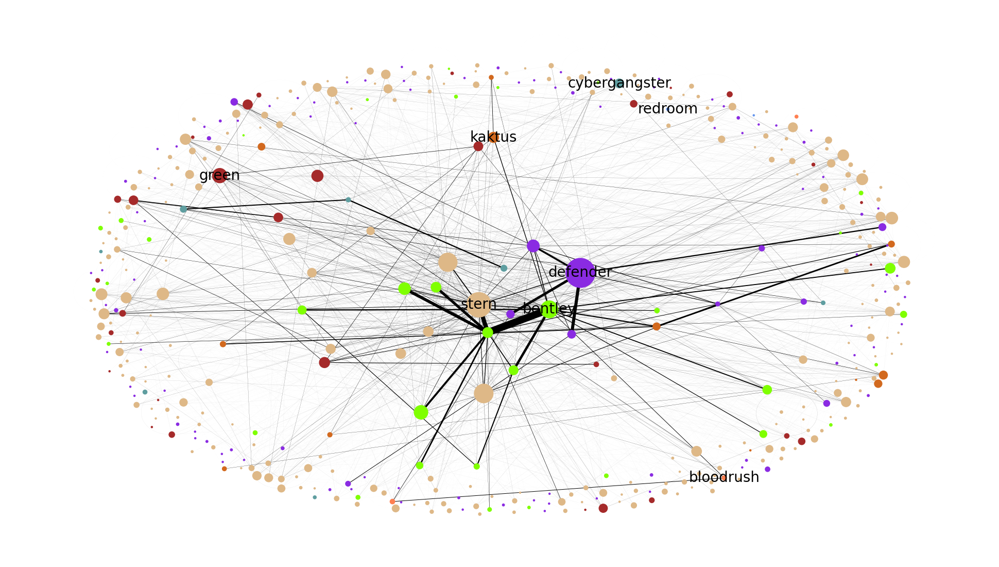

In [154]:
# Create a directed graph
G = nx.Graph()

# Count the conversations between users and add weighted edges
conversations = name_df.groupby(['from_short', 'to_short']).size().reset_index(name='weight')
for _, row in conversations.iterrows():
    G.add_edge(row['from_short'], row['to_short'], weight=row['weight'])

# Perform community detection using the Louvain algorithm
partition = community.best_partition(G)

# Add the community partition as a node attribute
nx.set_node_attributes(G, partition, name='community')

# Calculate Eigenvector Centrality for each node
eigenvector_centrality = nx.eigenvector_centrality(G)

# Create a dictionary to store the highest eigenvector node for each community
highest_eigenvector_nodes = {}
for node in G.nodes():
    community_id = partition[node]
    if community_id not in highest_eigenvector_nodes or eigenvector_centrality[node] > eigenvector_centrality[highest_eigenvector_nodes[community_id]]:
        highest_eigenvector_nodes[community_id] = node

# Spread out the graph using a different layout algorithm (e.g., Kamada-Kaway)
pos = nx.spring_layout(G, k=5)

# Create a custom colormap with light colors
num_communities = max(partition.values()) + 1
light_colors = list(mcolors.CSS4_COLORS.values())[10:10+num_communities]
custom_cmap = mcolors.ListedColormap(light_colors)

# Draw the graph with community coloring and labels for highest eigenvector nodes
node_colors = [partition[node] for node in G.nodes()]
labels = {node: node if node in highest_eigenvector_nodes.values() else '' for node in G.nodes()}
nx.draw(G, pos, with_labels=True, labels=labels, node_size=node_sizes, font_size=20, width=edge_thicknesses, node_color=node_colors, cmap=custom_cmap)

# Show the graph
plt.show()


In [162]:
partition = community.best_partition(G)
target_node = 'cybergangster'
community_of_target = partition[target_node]
print(f"The community of node {target_node} is {community_of_target}")


The community of node cybergangster is 6


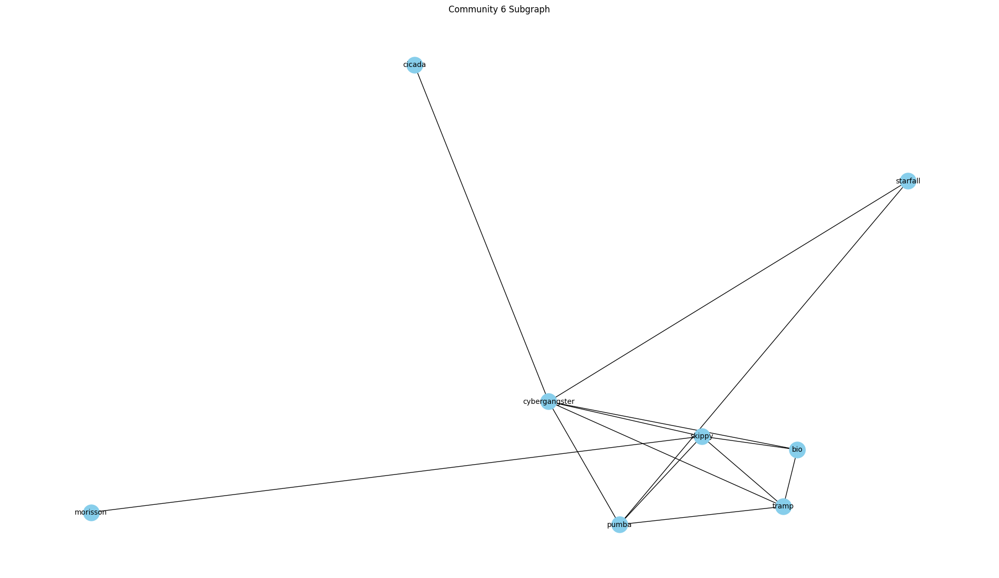

In [163]:
nodes_in_community = [node for node, community_label in partition.items() if community_label == community_of_target]
subgraph = G.subgraph(nodes_in_community)
pos = nx.spring_layout(subgraph, k=5)  # You can use different layout algorithms
nx.draw(subgraph, pos, with_labels=True, node_color="skyblue", node_size=500, font_size=10)
plt.title(f"Community {community_of_target} Subgraph")
plt.show()

In [84]:
h,authorityh = nx.hits(G)
df_metrics = pd.DataFrame(dict(
    in_degree = nx.degree_centrality(G),
    eigenvector = nx.eigenvector_centrality(G),
    closeness = nx.closeness_centrality(G),
    betweenness = nx.betweenness_centrality(G),
    hubs = h,
    authority = authorityh
))
df_metrics.sort_values(by=["betweenness"],ascending=False).head(8)

,in_degree,eigenvector,closeness,betweenness,hubs,authority
defender,1.058036,0.265565,0.457594,0.293313,0.016427,0.011616
stern,0.859375,0.272806,0.463742,0.167865,0.035312,0.126808
mango,0.522321,0.197538,0.413007,0.065335,0.025104,0.009410
buza,0.511161,0.200421,0.407436,0.058666,0.004355,0.021509
bentley,0.450893,0.219001,0.414424,0.043992,0.039064,0.225931
ford,0.212054,0.096825,0.365521,0.031781,0.000267,0.000304
revers,0.281250,0.136812,0.372279,0.025412,0.009185,0.054795
green,0.303571,0.190346,0.402682,0.022014,0.004995,0.010097


In [83]:
# Calculate average degree
average_degree = sum(dict(G.degree()).values()) / len(G)

# Calculate average closeness centrality
average_closeness = sum(nx.closeness_centrality(G).values()) / len(G)

# Calculate average betweenness centrality
average_betweenness = sum(nx.betweenness_centrality(G).values()) / len(G)

print(f"Average Degree: {average_degree:.2f}")
print(f"Average Closeness Centrality: {average_closeness:.4f}")
print(f"Average Betweenness Centrality: {average_betweenness:.4f}")

Average Degree: 17.64
Average Closeness Centrality: 0.2960
Average Betweenness Centrality: 0.0025


In [94]:
# Define the threshold for the number of unique conversations
threshold = 10

# Get a list of nodes with less than the specified number of unique conversations
nodes_with_few_conversations = [node for node in G.nodes() if sum(1 for (_, _, data) in G.out_edges(node, data=True) if data['weight'] > 0) < threshold]

print("Nodes with less than", threshold, "unique conversations:", nodes_with_few_conversations)
print(len(nodes_with_few_conversations))

Nodes with less than 10 unique conversations: ['8383', 'admin', 'qwerty', 'admintest', 'admu', 'ahtung', 'bumer', 'ahtyng', 'alarm', 'alarm2', 'noman', 'saulgdmn', 'blackjob', 'alert', 'mult', 'alter', 'grafin', 'answer', 'firefox333', 'axel', 'fox', 'miguel', 'atlas', 'born', 'mashroom', 'bezdar', 'void', 'b2zbrzj5sljbmemgfqnn7zlarduyjhvjwt', 'chip', 'globus', 'kingston', 'max', 'baly', 'balzak', 'band', 'baraka', 'beta', 'stakan', 'barmen', 'support-100', 'bash', 'fatboy', 'batka', 'baxter', 'buran', 'dylan', 'ed', 'eleos', 'eleoslin', 'horse', 'mitzi', 'porovoz', 'tort', 'bekeeper', 'best', 'blood', 'bloodrush', 'bonen', 'brom', 'clipper', 'forbes', 'forest', 'impact', 'kent', 'kran', 'leo', 'merch', 'mozart', 'netman', 'ponetre', 'revan', 'xenon', 'beny', 'doomsday', 'gus', 'sharn', 'skywalker', 'tunri', 'billgeizh', 'bio', 'tiniles', 'joynses', 'guava', 'boba', 'cobdoctor', 'grajdanin', 'modnik', 'muchacho', 'oldtimes', 'sega', 'bourbon', 'keykey', 'verchunls', 'btdpnqwg2nqkqceetq

In [120]:
pd.set_option('display.max_colwidth', None)  # Show complete cell content
pd.set_option('display.expand_frame_repr', False)  # Prevent line wrapping

filtered_df = name_df[(name_df['body_en'] == "Hello, you need to register on some other external toad acc and throw me here, this is necessary in case of loss of this toad")]
print(filtered_df.head(500))
unique_users = filtered_df['to_short'].unique()
print(unique_users)
print(len(unique_users))

       Unnamed: 0                         ts                             from                              to                                                                                                                    body                                                                                                                        body_en body_language to_short from_short
3941         3941 2020-06-22 09:39:28.999928  defender@q3mcco35auwcstmt.onion  kerasid@q3mcco35auwcstmt.onion  Привет, нужно зарегать на какой нибудь другой внешней жабе акк и скинуть мне сюда, это нужно в случае потери этой жабы  Hello, you need to register on some other external toad acc and throw me here, this is necessary in case of loss of this toad           NaN  kerasid   defender
3942         3942 2020-06-22 09:39:29.504677  defender@q3mcco35auwcstmt.onion  steller@q3mcco35auwcstmt.onion  Привет, нужно зарегать на какой нибудь другой внешней жабе акк и скинуть мне сюда, это нужно в случае потер